In [4]:
import pandas as pd
import numpy as np
from plotly.subplots import make_subplots
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import json

In [5]:
d = pd.read_csv("Data/DataPreparation.csv")

In [6]:
data = pd.read_csv("Data/EDA_transformed.csv")
AAPL = pd.read_csv("Data/Apple.csv")
MSFT = pd.read_csv("Data/Microsoft.csv")
GE = pd.read_csv("Data/GeneralElectric.csv")
IBM = pd.read_csv("Data/IBM.csv")
JNJ = pd.read_csv("Data/Johnson&Johnson.csv")
data["Year"] = pd.to_datetime(data["Date"]).dt.year
data["Month"] = pd.to_datetime(data["Date"]).dt.month

### UNIVARIATE

<li><b>Indicators</b></li>

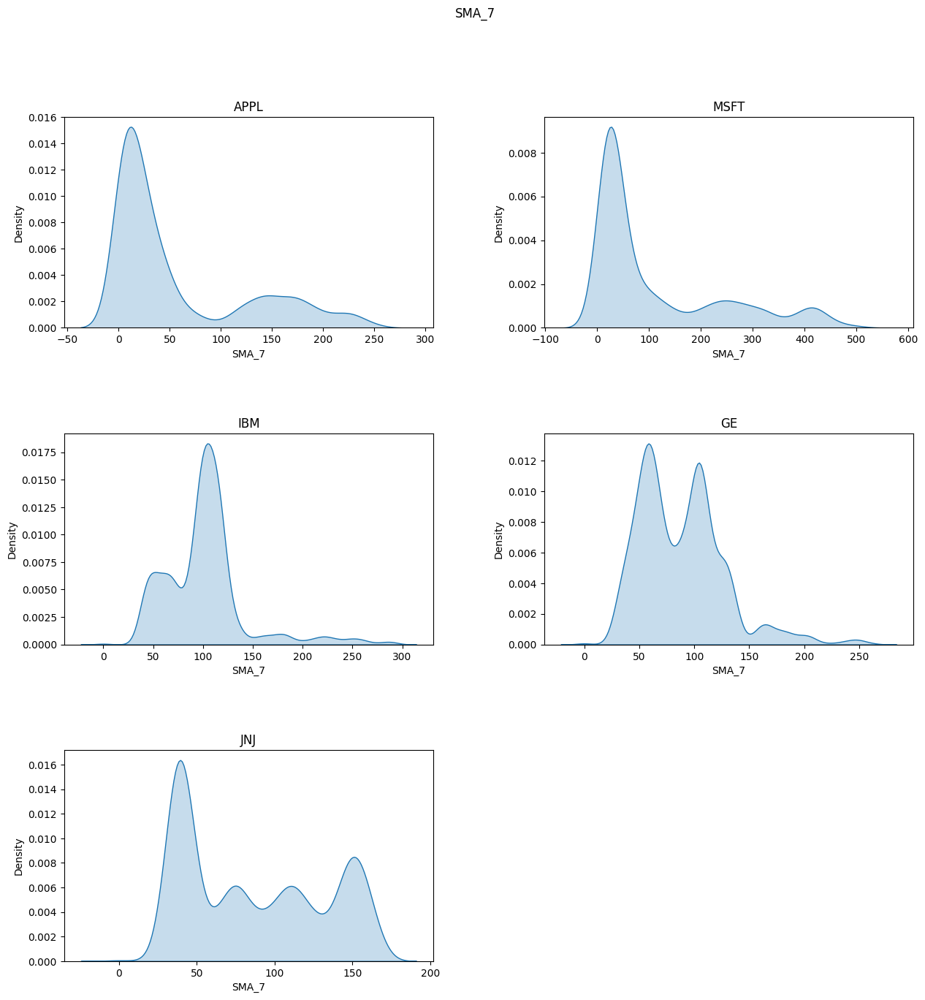

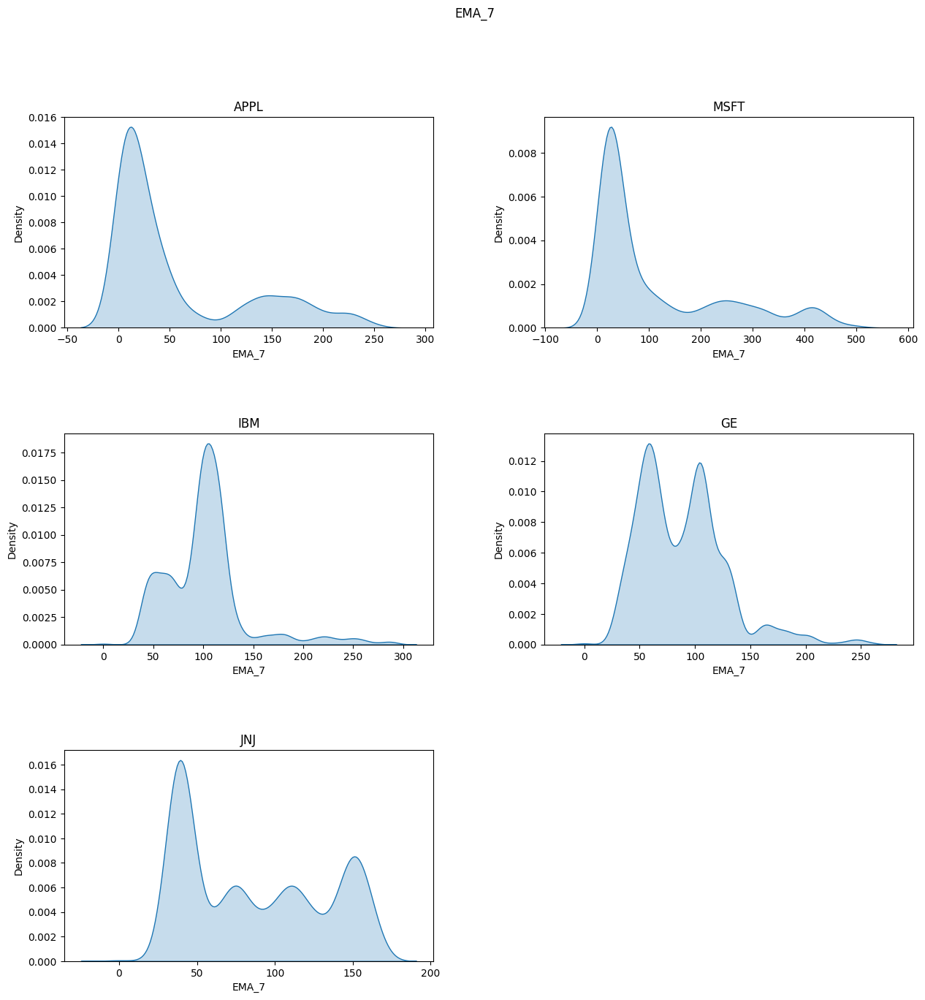

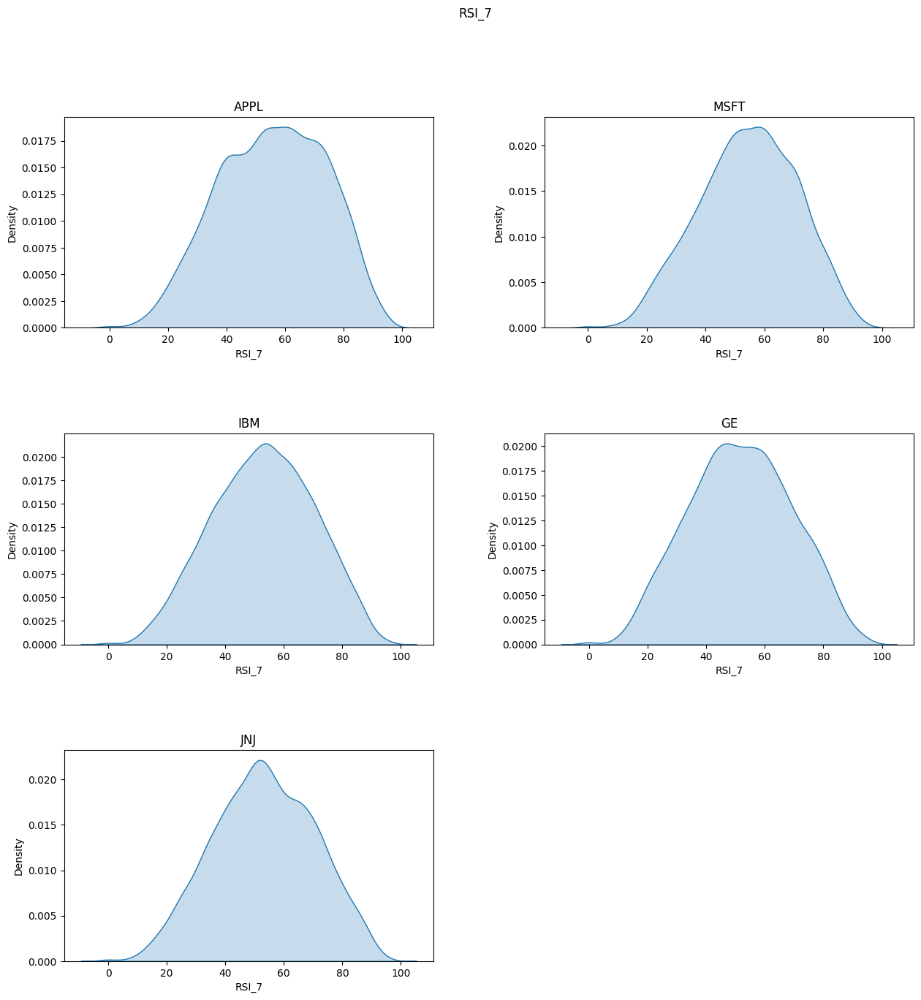

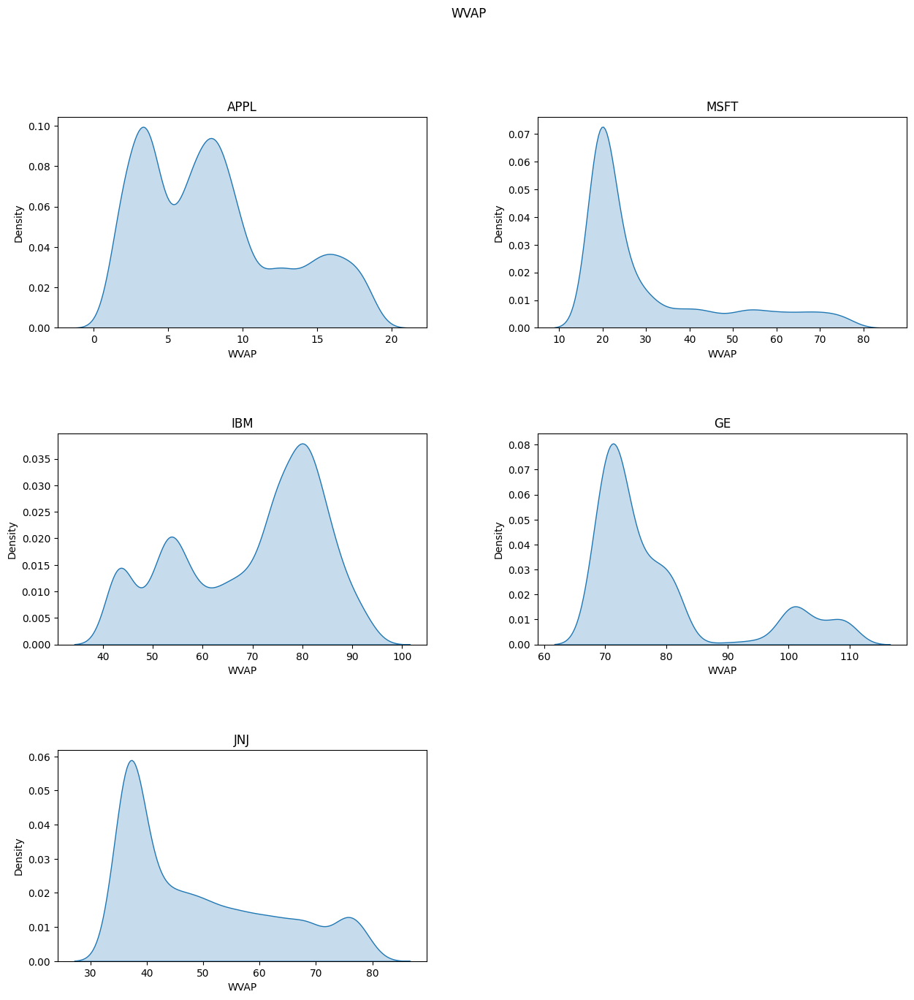

In [7]:
Indicators = AAPL.iloc[:,[7,8,9,10]].columns
for indicators in Indicators:
    fig,ax = plt.subplots(3,2,figsize=(15,15))
    fig.subplots_adjust(wspace=0.3,hspace=0.5)
    fig.suptitle(indicators)
    sns.kdeplot(AAPL[indicators],fill=True,ax=ax[0,0])
    ax[0,0].set_title("APPL")
    sns.kdeplot(MSFT[indicators],fill=True,ax=ax[0,1])
    ax[0,1].set_title("MSFT")
    sns.kdeplot(IBM[indicators],fill=True,ax=ax[1,0])
    ax[1,0].set_title("IBM")
    sns.kdeplot(GE[indicators],fill=True,ax=ax[1,1])
    ax[1,1].set_title("GE")
    sns.kdeplot(JNJ[indicators],fill=True,ax=ax[2,0])
    ax[2,0].set_title("JNJ")
    ax[2,1].axis('off')
    plt.savefig(f"Visuals/Univariate/{indicators}_KDE",dpi=150)

<li><b>Prices</b></li>

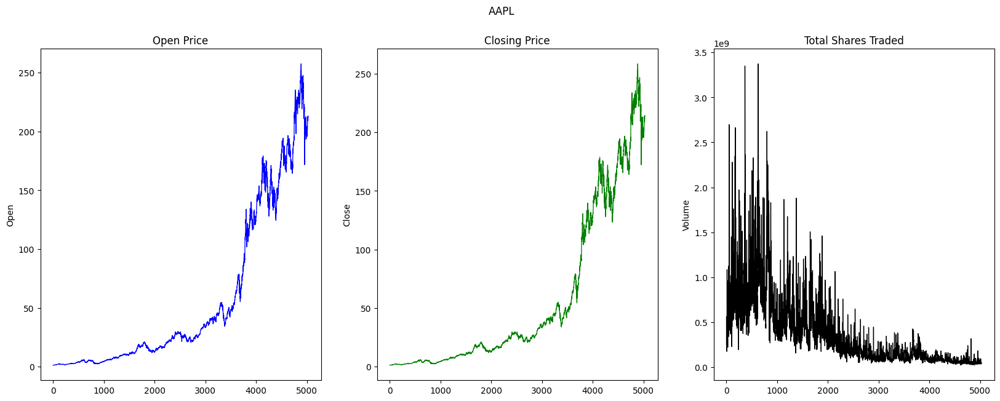

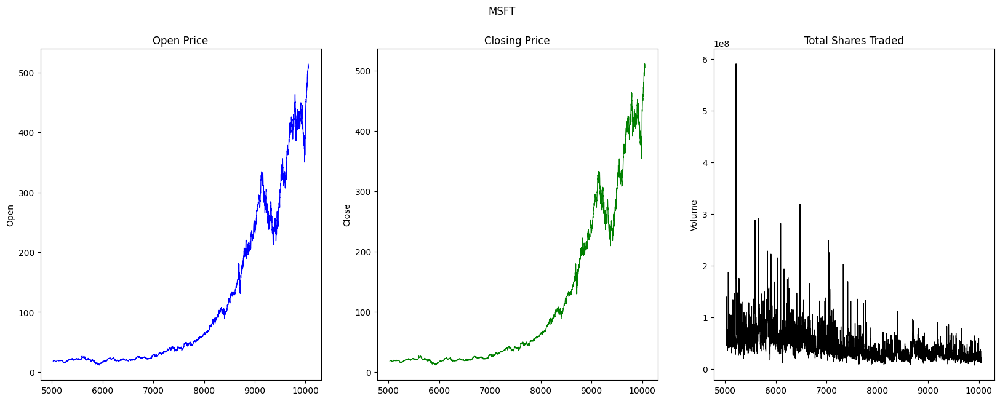

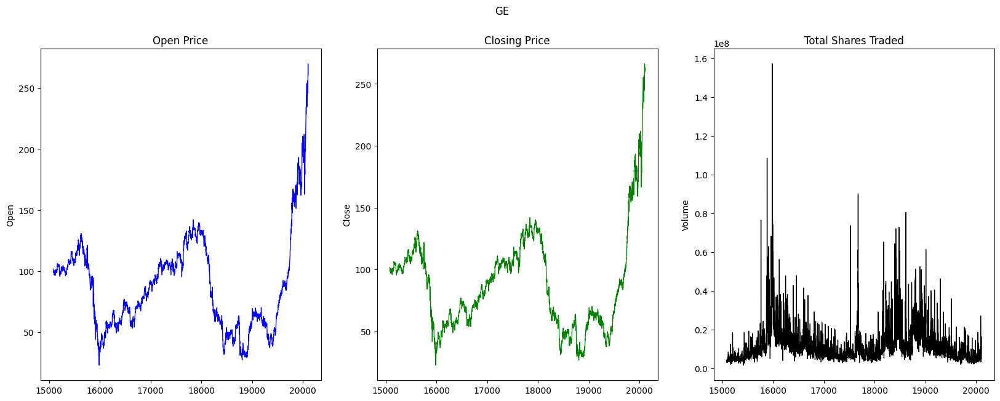

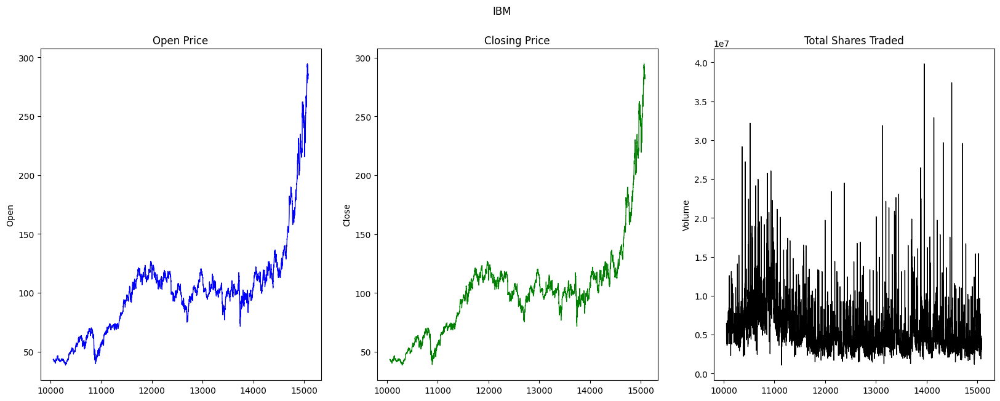

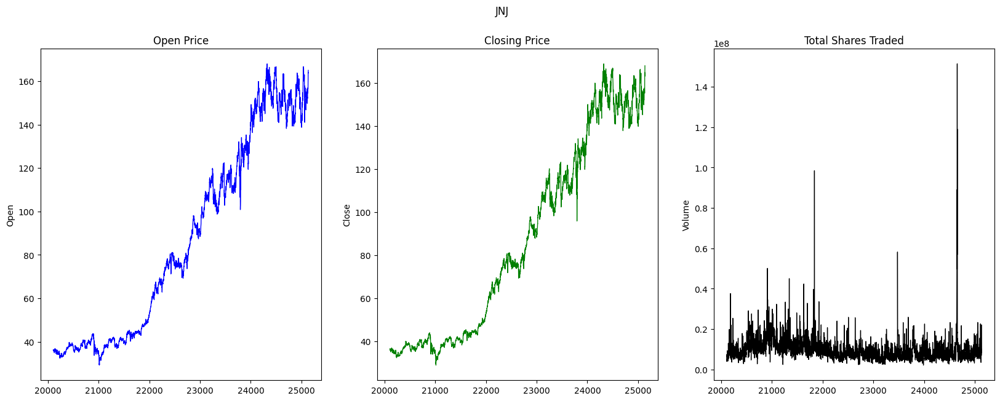

In [8]:
st = ["AAPL","MSFT","GE","IBM","JNJ"]
for i in range(len(st)):
    fig,ax=plt.subplots(nrows=1,ncols=3,figsize=(20,7))
    fig.suptitle(st[i])
    sns.lineplot(d[d["Stocks"]==st[i]]["Open"],color="Blue",linestyle="solid",linewidth=0.95,ax=ax[0])
    ax[0].set_title("Open Price")
    sns.lineplot(d[d["Stocks"]==st[i]]["Close"],color="Green",linestyle="solid",linewidth=0.95,ax=ax[1])
    ax[1].set_title("Closing Price")
    sns.lineplot(d[d["Stocks"]==st[i]]["Volume"],color="black",linestyle="solid",linewidth=0.95,ax=ax[2])
    ax[2].set_title("Total Shares Traded")
    plt.savefig(f"Visuals/Univariate/{st[i]}_Prices",dpi=150)
    

### BIVARIATE

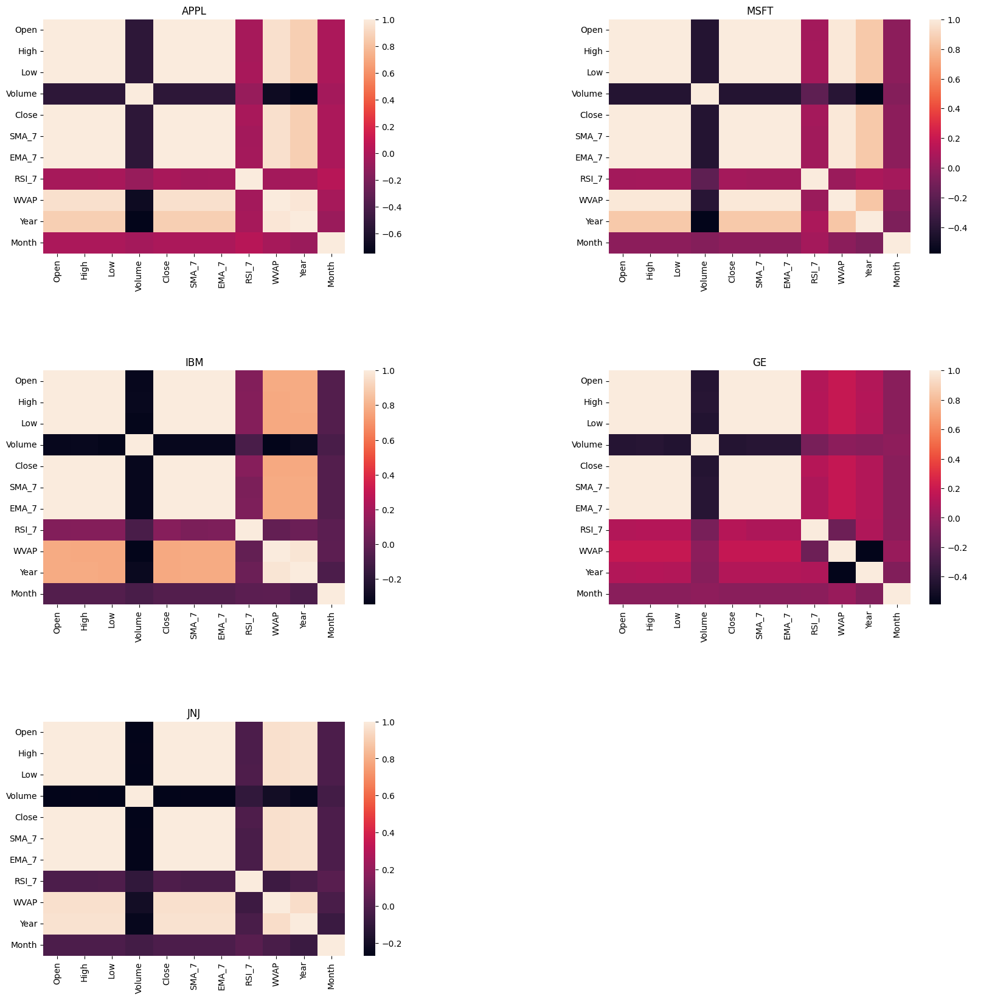

In [9]:
fig,ax = plt.subplots(nrows=3,ncols=2,figsize=(20,20))
fig.subplots_adjust(wspace=0.5,hspace=0.5)
sns.heatmap(AAPL.corr(numeric_only=True),ax=ax[0,0])
ax[0][0].set_title("APPL")
sns.heatmap(MSFT.corr(numeric_only=True),ax=ax[0,1])
ax[0][1].set_title("MSFT")
sns.heatmap(IBM.corr(numeric_only=True),ax=ax[1,0])
ax[1][0].set_title("IBM")
sns.heatmap(GE.corr(numeric_only=True),ax=ax[1,1])
ax[1][1].set_title("GE")
sns.heatmap(JNJ.corr(numeric_only=True),ax=ax[2,0])
ax[2][0].set_title("JNJ")
ax[2][1].axis("off")
plt.savefig(f"Visuals/Bivariate/Stocks_heatmap",dpi=150)

In [10]:
fig = px.line(data,x=data["Date"],y=data["Close"],color=data["Stocks"],title="Closing Price PerStocks")
fig.write_image("Visuals/Bivariate/ClosingPerStocks.png",scale=2)
fig.show()

In [11]:
fig = px.line(data,x=data["Date"],y=data["Volume"],color=data["Stocks"],title="Volume PerStocks")
fig.write_image("Visuals/Bivariate/VolumePerStocks.png",scale=2)
fig.show()

In [12]:
stocks = data["Stocks"].unique()
fig = make_subplots(rows=3,cols=2,subplot_titles=stocks)
fig1 = px.scatter(AAPL,x=AAPL["Date"],y="Close",color="WVAP")
fig2 = px.scatter(MSFT,x=AAPL["Date"],y="Close",color="WVAP")
fig3 = px.scatter(GE,x=AAPL["Date"],y="Close",color="WVAP")
fig4 = px.scatter(IBM,x=AAPL["Date"],y="Close",color="WVAP")
fig5 = px.scatter(JNJ,x=AAPL["Date"],y="Close",color="WVAP")
for trace in fig1.data:
        fig.add_trace(trace,row=1,col=1)
for trace in fig2.data:
        fig.add_trace(trace,row=1,col=2)
for trace in fig3.data:
        fig.add_trace(trace,row=2,col=1)
for trace in fig4.data:
        fig.add_trace(trace,row=2,col=2)
for trace in fig5.data:
        fig.add_trace(trace,row=3,col=1)
fig.update_layout(height=1000,width=1500,title_text="WVAP_Analysis/color:WVAP",xaxis_title="Date",yaxis_title="Close")
fig.write_image("Visuals/Bivariate/WVAP_Analysis.png",height=1200,width=1000,scale=2)
fig.show()
    

In [13]:
indc = ["SMA_7"]
for i in indc:
    stocks = data["Stocks"].unique()
    fig = make_subplots(rows=3,cols=2,subplot_titles=stocks)
    if i=="WVAP":
        pass
        
    else:
        fig1 = px.scatter(AAPL,x=AAPL["Date"],y=AAPL[i],color="Close")
        fig2 = px.scatter(MSFT,x=MSFT["Date"],y=MSFT[i],color="Close")
        fig3 = px.scatter(IBM,x=IBM["Date"],y=IBM[i],color="Close")
        fig4 = px.scatter(GE,x=GE["Date"],y=GE[i],color="Close")
        fig5 = px.scatter(JNJ,x=JNJ["Date"],y=JNJ[i],color="Close")
        
    for trace in fig1.data:
        fig.add_trace(trace,row=1,col=1)
    for trace in fig2.data:
        fig.add_trace(trace,row=1,col=2)
    for trace in fig3.data:
        fig.add_trace(trace,row=2,col=1)
    for trace in fig4.data:
        fig.add_trace(trace,row=2,col=2)
    for trace in fig5.data:
        fig.add_trace(trace,row=3,col=1)
    if i=="WVAP":
        pass
    else:
        i="SMA_7 Analysis/color:Close"
        savefig="SMA_7"
        fig.update_layout(height=1000,width=1500,title_text=i,xaxis_title="Date",yaxis_title="SMA_7")
    fig.write_image(f"Visuals/Bivariate/{savefig}_Analysis.png",height=1200,width=1000,scale=3)
    fig.show()

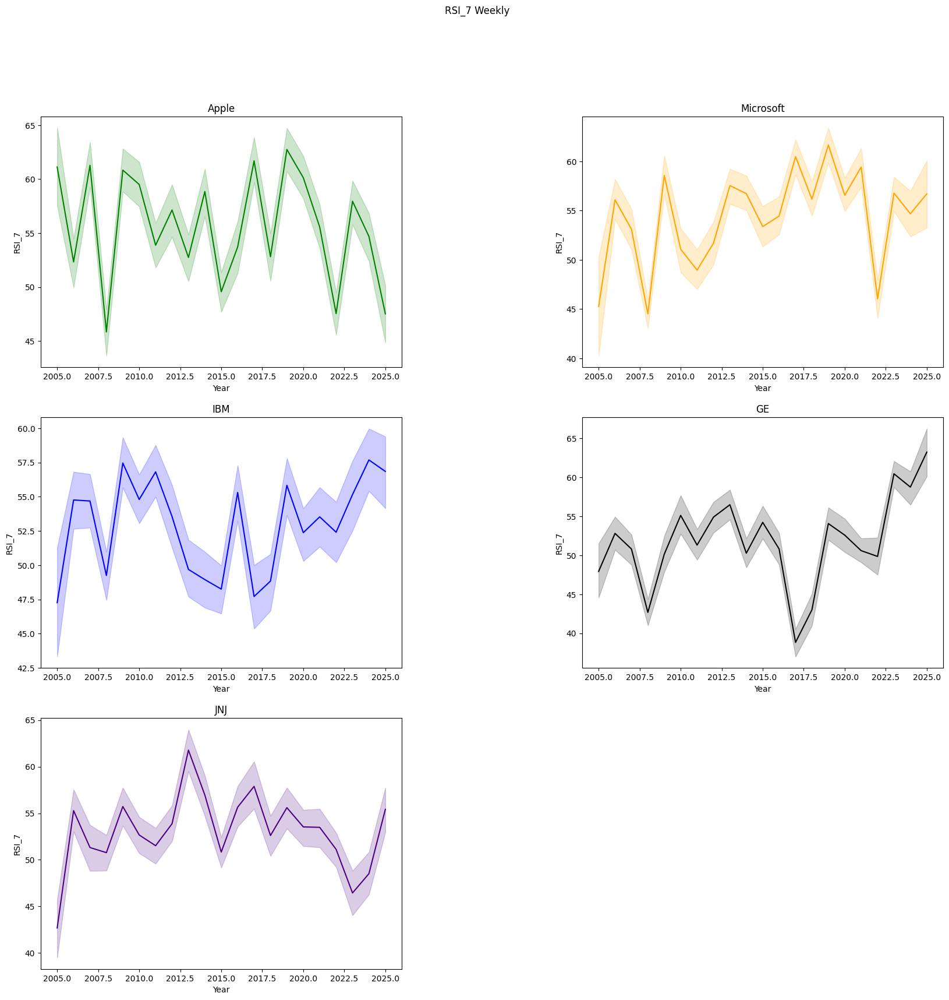

In [14]:
fig,ax = plt.subplots(3,2,figsize=(20,19))
fig.subplots_adjust(wspace=0.5)
fig.suptitle("RSI_7 Weekly")
sns.lineplot(x=AAPL["Year"],y=AAPL["RSI_7"],color="green",ax=ax[0,0])
ax[0][0].set_title("Apple")
sns.lineplot(x=MSFT["Year"],y=MSFT["RSI_7"],color="orange",ax=ax[0,1])
ax[0][1].set_title("Microsoft")
sns.lineplot(x=IBM["Year"],y=IBM["RSI_7"],color="blue",ax=ax[1,0])
ax[1][0].set_title("IBM")
sns.lineplot(x=GE["Year"],y=GE["RSI_7"],color="black",ax=ax[1,1])
ax[1][1].set_title("GE")
sns.lineplot(x=JNJ["Year"],y=JNJ["RSI_7"],color="indigo",ax=ax[2,0])
ax[2][0].set_title("JNJ")
ax[2,1].axis("off")
fig.savefig("Visuals/Bivariate/RSIperStocks(Year).png",dpi=150)

In [15]:
fig = make_subplots(rows=3,cols=2,subplot_titles=stocks)
fig1 = px.scatter(AAPL, x="Date", y="RSI_7", color="Close")
fig2 = px.scatter(MSFT, x="Date", y="RSI_7", color="Close")
fig3 = px.scatter(IBM, x="Date", y="RSI_7", color="Close")
fig4 = px.scatter(GE, x="Date", y="RSI_7", color="Close")
fig5 = px.scatter(JNJ, x="Date", y="RSI_7", color="Close")
for i in fig1.data:
    fig.add_trace(i,row=1,col=1)
for i in fig2.data:
    fig.add_trace(i,row=1,col=2)
for i in fig3.data:
    fig.add_trace(i,row=2,col=1)
for i in fig4.data:
    fig.add_trace(i,row=2,col=2)
for i in fig5.data:
    fig.add_trace(i,row=3,col=1)
fig.update_layout(height=1000,width=2000,title_text="RSI Analysis/Close",xaxis_title="Date",yaxis_title="RSI")
fig.write_image("Visuals/Bivariate/RSI_AnalysisPerStocks.png",height=1200,width=1000,scale=2)
fig.show()


<h1><b>FINAL REPORT: EXPLORATORY DATA-ANALYSIS</b></h1>
<li type="1"><b>UNIVARIATE INSIGHTS: </b></li>
<ul><li>SMA (Window 7): <br>
AAPL shows high frequent values where SMA is significantly lower(near to 0) and fatter tail towards the right with SMA ranging from 100-200 but less frequent.It shows high price fluctuations towards the end.<br>
Similar to AAPL, MSFT peaks near to 0 with high frequent and leading towards right with somewhat fatter tail, ranging SMA 200-350 but less frequent.Shows high fluctuations of prices.<br>
IBM with a small peak followed by highest peak shows high frequent values near 100 and gradually decreases but with no high fluctuations.It shows a Stable trend towards the end.<br>
GE with 2 high peaks near 50 and 100. No high fluctuations towards the end followed by Low SMA<BR>
JNJ shows distributions of SMA with high Frequent near 50 followed by 100 and 150.No potiential outliers but high and frequent fluctuations.
</li></ul>
<ul><li>RSI (Window 7):<br>
    All stocks forms a bell-shaped curve within the region of greater than 30 and smaller than 70 which shows that there is'nt any higher risk as Momentum stays neutral.
</li>
</ul>
<ul>
<li>WVAP (Window 7):<br>
       AAPL shows 2 high peaks that means most frequent values near 5 and 10 followed by low frequent near 15.<br>
       MSFT shows high density near 20 followed by fatter tail towards the end suggesting high spread but low frequent values with high WVAP.<br>
       IBM with 3 peaks shows increase in frequency of WVAP near 50 and 80.No outliers<br>
       GE shows high peak near 70 but significantly low at 90.
       JNJ shows avg trading levels.
    </li>
</ul>
<li type="1"><b>BIVARIATE ANALYSIS</b></li>
<ul>
    <li>RSI is Negatively or Low correlation with Stock Prices of all Stocks and Volume is Negatively correlation with Prices</li>
    <li>Microsoft Closing price gives higher upward trend as compared to other stocks that stays almost at equal levels with trend</li>
    <li>Volume in AAPL is significantly high during 2006-2014 and gradually decays towards the end followed by MSFT and other stocks with low volume as compared to AAPL throughout the stages</li>
    <li><b>WVAP Analysis:</b></li><br>
    Low WVAP in AAPL and High WVAP in MSFT however Prices stays in neutral or bullish region(upward trend),gradually increases towards the end.<br>
    High WVAP in IBM however Prices during 2008-2010 significantly decreases that shows oversold region followed by reversal upward from 2011-2017 then again decreases upto 2022 followed by significant increase(overbought) in Prices towards the end.it shows that it might reversal down in the near future.<br>
    High WVAP in stocks GE and JNJ.Prices mostly shows upward trend(bullish region) and oversold from year 2024 for GE that potentially might lead to reverse-down.
</ul>